# New CVID data

All samples (batch 1 + batch 2), excluding twins

10.02.2021

(Preprocessing happened in notebook M1)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do SCTransfor instead of normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes
- subset to HVGs
- (skipping scaling, not necessary because we've done SCTransform)
- pca (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logreg model and add annotation (before it used to be earlier in the workflow)**
- neighbors/bbknn - deciding on which batch correction we will be using
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
# need to do 'pip3 install bbknn==1.3.8' to avoid incompatibility errors
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
%%bash

pip freeze

aiohttp==3.6.2
alembic==1.3.0
anndata==0.7.5
annoy==1.16.2
async-generator==1.10
async-timeout==3.0.1
attrs==19.3.0
backcall==0.1.0
bbknn==1.3.6
bleach==3.1.0
blinker==1.4
certifi==2019.9.11
certipy==0.1.3
cffi==1.13.2
chardet==3.0.4
Click==7.0
conda==4.7.12
conda-package-handling==1.6.0
cryptography==2.8
cycler==0.10.0
Cython==0.29.14
decorator==4.4.1
defusedxml==0.6.0
entrypoints==0.3
fbpca==1.0
geosketch==1.0
get-version==2.1
h5py==2.10.0
idna==2.8
imageio==2.9.0
importlib-metadata==0.23
intervaltree==2.1.0
ipykernel==5.1.3
ipython==7.9.0
ipython-genutils==0.2.0
jedi==0.15.1
Jinja2==2.10.3
joblib==0.14.0
json5==0.8.5
jsonschema==3.1.1
jupyter-client==5.3.3
jupyter-core==4.5.0
jupyter-rsession-proxy==1.0b6
jupyter-server-proxy==1.2.0
jupyterhub==1.0.0
jupyterlab==1.2.1
jupyterlab-server==1.0.6
kiwisolver==1.1.0
legacy-api-wrap==1.2
leidenalg==0.7.0
llvmlite==0.30.0
loompy==3.0.6
louvain==0.6.1
Mako==1.1.0
MarkupSafe==1.1.1
matplotlib==3.3.4
mistune==0.8.4
more-itertools==7.2.0
multid

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
annoy               NA
attr                19.3.0
backcall            0.1.0
bbknn               NA
cffi                1.13.2
constants           NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.1
get_version         2.1
h5py                2.10.0
highs_wrapper       NA
igraph              0.7.1
importlib_metadata  0.23
ipykernel           5.1.3
ipython_genutils    0.2.0
jedi                0.15.1
joblib              0.14.0
kiwisolver          1.1.0
legacy_api_wrap     1.2
leidenalg           0.7.0
llvmlite            0.30.0
louvain             0.6.1
matplotlib          3.3.4
more_itertools      NA
mpl_toolkits        NA
natsort             6.2.0
numba               0.46.0
numexpr             2.7.0
numpy               1.17.4
packaging           19.2
pandas              0.25.3
parso               0.5.1
pexpect        

A Benjamini-Hochberg function for later. Running FDR is surprisingly inconvenient using built-in Python options.

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

## Reding the preprocessed object

Preprocessing happened in M1-0 notebook, preliminary analysis - in notebook M1-1

In [11]:
# reading
adata = sc.read(save_path+'adata_raw_filtered_validation_cohort.h5ad')

In [12]:
adata.var['feature_types-0'].value_counts()

Gene Expression     17254
nan                  4303
Antibody Capture      192
Name: feature_types-0, dtype: int64

In [16]:
# reading indices of cells that were not called as doublets
indices = pd.read_csv('./cells_no_doublets_GEX_only_based_validation_cohort_20210210.csv', index_col=0)['index']

In [17]:
indices

0           AAACCTGAGAATGTGT-1
1           AAACCTGAGACTAAGT-1
2           AAACCTGAGCCGCCTA-1
3           AAACCTGAGCGCCTCA-1
4           AAACCTGAGGATGTAT-1
                  ...         
107045    TTTGTCATCCCTTGCA-1-1
107046      TTTGTCATCCGCGTTT-1
107047      TTTGTCATCGGAGGTA-1
107048    TTTGTCATCGGCTACG-1-1
107049      TTTGTCATCTTGGGTA-1
Name: index, Length: 107050, dtype: object

In [18]:
len(set(adata.obs_names) & set(indices))

107050

In [19]:
adata

AnnData object with n_obs × n_vars = 112463 × 21749 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

In [21]:
# subsetting the adata to non-doublet cells and only genes
adata = adata[:, adata.var['feature_types-0'] != 'Antibody Capture' ].copy()
adata = adata[list(indices), :].copy()

In [22]:
adata

AnnData object with n_obs × n_vars = 107050 × 21557 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

In [23]:
# to gain donor information reading preliminarily analysed object
adata_prelim = sc.read(save_path+'adata_hvg_prelim_analysis_validation_cohort.h5ad')

In [24]:
adata_prelim

AnnData object with n_obs × n_vars = 112463 × 2757 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'louvain', 'is_doublet_propagate'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ccgs', 'donor_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'phase_colo

In [25]:
# transferring metadata
for col in ['donor']:
    adata.obs[col] = adata_prelim.obs.loc[adata.obs_names,col]

In [26]:
np.unique(adata.obs['sample'])

array(['35008_CV005_RV9039258_and_35008_CV005_RV9039282',
       '35008_CV005_RV9039259_and_35008_CV005_RV9039283',
       '35008_CV005_RV9039260_and_35008_CV005_RV9039284',
       '35008_CV005_RV9039261_and_35008_CV005_RV9039285',
       '35008_CV005_RV9039262_and_35008_CV005_RV9039286',
       '35008_CV005_RV9039263_and_35008_CV005_RV9039287',
       '35171_CV005_RV9039361', '35171_CV005_RV9039362',
       '35171_CV005_RV9039363'], dtype=object)

In [27]:
expr_mtx_check = adata[adata.obs['sample'] == '35008_CV005_RV9039258_and_35008_CV005_RV9039282'].X.todense()
np.unique(expr_mtx_check)

matrix([[   0.,    0.,    0., ..., 2230., 2622., 2657.]], dtype=float32)

___________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [28]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving the raw attribute
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:04): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Second step of bertie doublet removal - will be done later in the pipeline

_____________________________________________________________________________________________________________________________________________________________

### Filter Cell cycle genes 
Per genes analysis: identify genes behaving like known cell cycle genes

There are no cycle genes, so skipping this here

extracting highly variable genes
    finished (0:00:44)


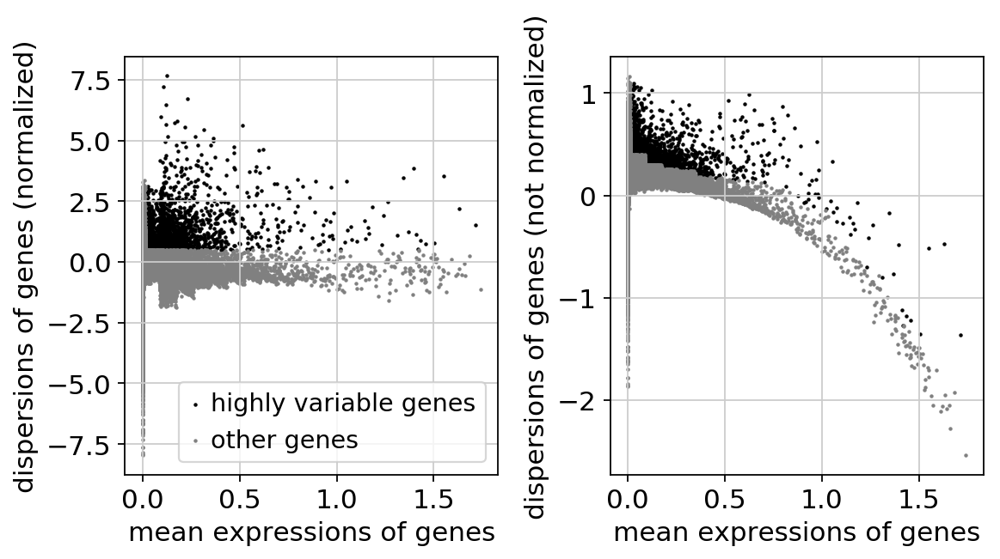

In [29]:
cellcycle_adata = adata.copy()
# Extract highly variable genes
filter_result = sc.pp.filter_genes_dispersion(
    cellcycle_adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result,save='_ccg_identification.pdf')

In [30]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T
cellcycle_adata = cellcycle_adata[filter_result.gene_subset,:]


In [31]:
%%time
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(cellcycle_adata, n_comps=30)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 30
    finished (0:00:04)
CPU times: user 25.9 s, sys: 24.9 s, total: 50.8 s
Wall time: 6.18 s


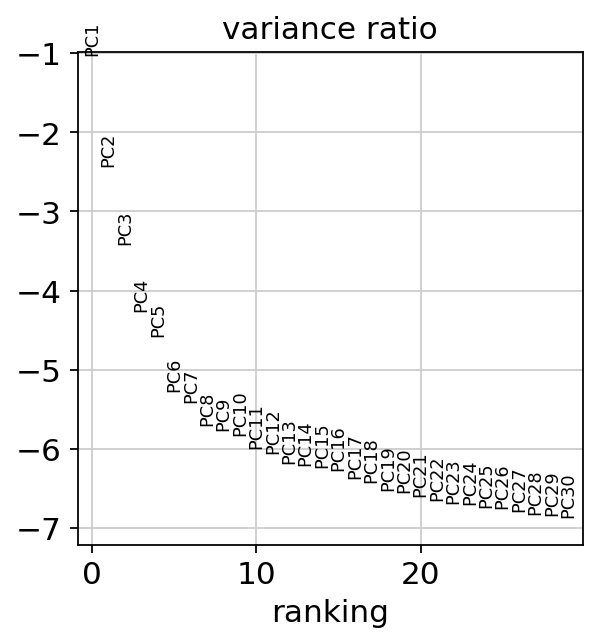

In [32]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 13
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


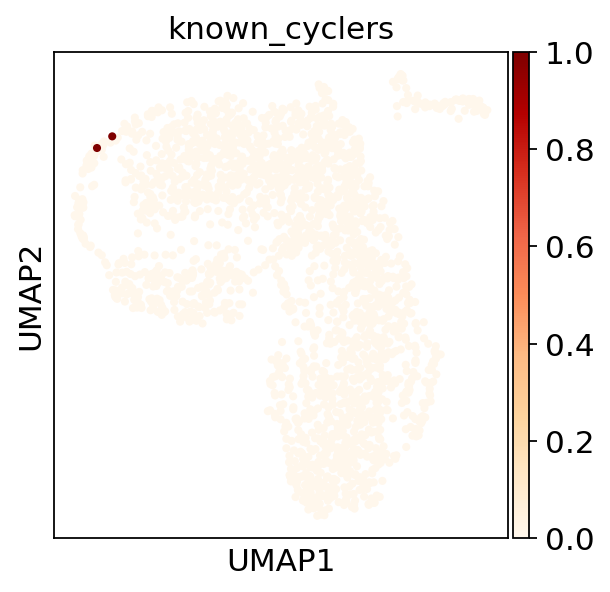

In [33]:
# Identify genes behaving like cc genes
num_pcs = 13
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


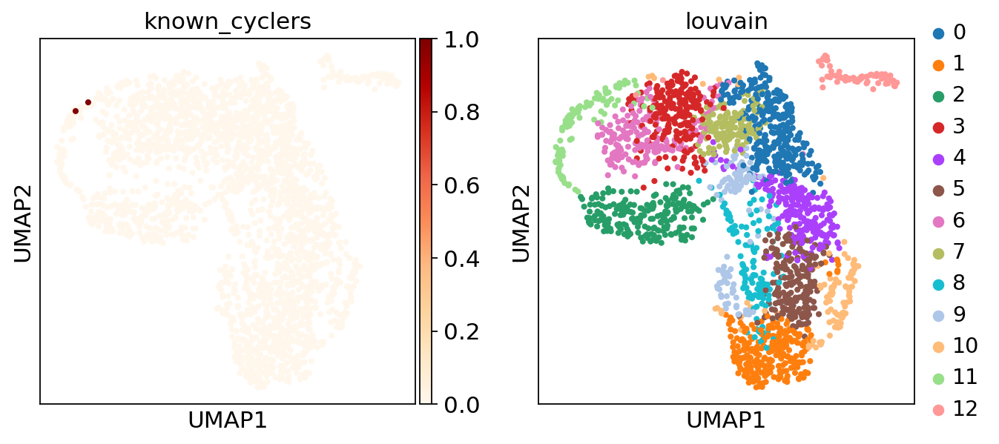

In [34]:
# Cluster GENES into subgroups using louvain
sc.tl.louvain(cellcycle_adata, resolution=1.0)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers',
                                  'louvain'],color_map='OrRd',save='_ccg_identification.pdf')

In [35]:
# Locate genes of interests' cluster
print(cellcycle_adata.obs.loc[['CDK1','MKI67','CCNB2','PCNA'],'louvain'])


index
CDK1     NaN
MKI67     11
CCNB2    NaN
PCNA      11
Name: louvain, dtype: category
Categories (13, object): [0, 1, 2, 3, ..., 9, 10, 11, 12]


/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:961: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [36]:
adata

AnnData object with n_obs × n_vars = 107050 × 21557 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

So removing genes from cluster 11 by filtering the main matrix

In [37]:
# Add unstructured dict-like annotation for ccgs
adata.uns['ccgs'] = list(cellcycle_adata.obs[(cellcycle_adata.obs['louvain']=='11')].index)
# Remove cc genes
adata = adata[:,[i not in adata.uns['ccgs'] for i in adata.var_names]]


In [38]:
adata

View of AnnData object with n_obs × n_vars = 107050 × 21459 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'ccgs'

In [41]:
%%time
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

# takes a few minutes

calculating cell cycle phase
computing score 'S_score'


Trying to set attribute `.obs` of view, making a copy.


    finished: added
    'S_score', score of gene set (adata.obs) (0:04:25)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs) (0:03:07)
-->     'phase', cell cycle phase (adata.obs)
CPU times: user 19.5 s, sys: 7min 13s, total: 7min 32s
Wall time: 7min 32s


In [42]:
# saving filtered genes to then be used in GEX + protein analysis
pd.DataFrame(adata.var.index).to_csv('./genes_no_CC_associated_genes_new_20210209.csv')

In [43]:
adata

AnnData object with n_obs × n_vars = 107050 × 21459 
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'ccgs'

In [45]:
adata.write(save_path + 'adata_after_ccg_removal_validation_cohort.h5ad')

... storing 'phase' as categorical


In [6]:
adata = sc.read(save_path + 'adata_after_ccg_removal_validation_cohort.h5ad')

_______________________________________________________________________________________________________

# ANNOTATION through LOGISTIC REGRESSION

In [7]:
# object with previous analysis (with twins and BCR activation) - GEX + protein, final object
# .X is normalised, log tr and scaled, .raw.X - normalised and log tr
adata_sc_annotated = sc.read(save_path + 'adata_hvg_bbknn_by_sample_nodoublets_20_PCs_GEX_and_SoupX_denoised_protein_all_samples_cleaned_up_final_20210111.h5ad')

In [8]:
adata_sc_annotated

AnnData object with n_obs × n_vars = 145823 × 2696
    obs: 'n_genes', 'stimulation', 'sample', 'cell_id', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'cell_type_final', 'S_score', 'G2M_score', 'phase', 'louvain', 'n_counts_protein', 'n_counts_protein_lognorm', 'donor', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'f

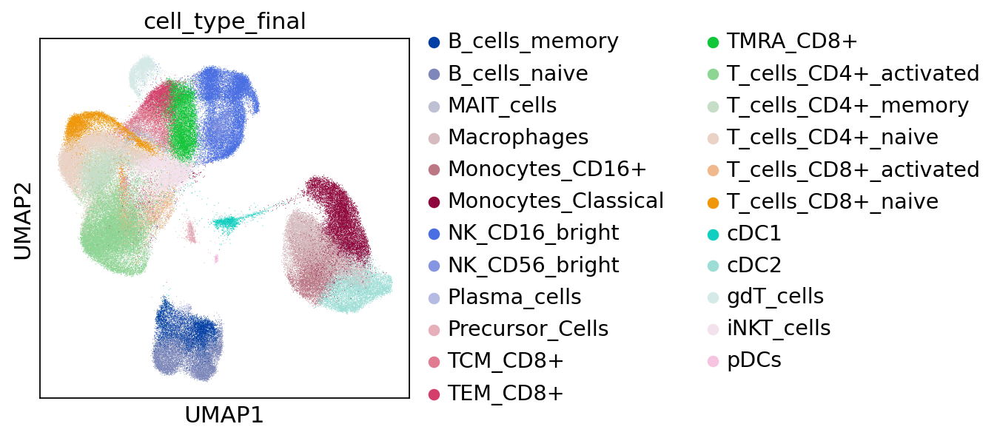

In [9]:
sc.pl.umap(adata_sc_annotated, color='cell_type_final')

In [10]:
np.unique(adata_sc_annotated.var['highly_variable'])

array([ True])

In [11]:
# these are HVGs
hvgs = adata_sc_annotated.var_names
len(hvgs)

2696

## Model 1 - trained on previous annotated GEX-only scRNA-seq object with the first 8 samples only

### Subsetting both datasets' copies to common genes only

I will train logreg on the subsetted data and tranfer the annotation onto the corresponding subsetted new data and then transfer that onto the full (with all genes) new dataset

In [12]:
# annotated object, normalised and log transformed in .raw.X, not scaled
adata_train = anndata.AnnData(X = adata_sc_annotated.raw.X,
                              obs = adata_sc_annotated.obs,
                              var = adata_sc_annotated.raw.var)
# subsetting to HVG
adata_train = adata_train[:,hvgs].copy()

# scaling the test object
sc.pp.scale(adata_train, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [13]:
# normalised, log transformed object, not scaled
adata_test = adata.copy()

# scaling the test object
sc.pp.scale(adata_test, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [14]:
adata_train.obs.columns

Index(['n_genes', 'stimulation', 'sample', 'cell_id', 'percent_mito',
       'n_counts', 'dataset', 'technique', 'scrublet_score',
       'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet',
       'cell_type_final', 'S_score', 'G2M_score', 'phase', 'louvain',
       'n_counts_protein', 'n_counts_protein_lognorm', 'donor', 'Age', 'Sex',
       'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease',
       'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly',
       'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members',
       'CVID_status'],
      dtype='object')

In [15]:
# list of genes shared between blood and bone marrow data
# doing sorted on the overall list is VERY important for consistent ordering of the genes
common_genes = sorted(list(set(adata_train.var_names) & set(adata_test.var_names)))
print(len(common_genes),"genes are shared between annotated train and our joint data \n",
      len(set(adata_train.var_names)), 'genes in training data \n',
      len((set(adata_test.var_names))), 'genes in test joint data \n')

2555 genes are shared between annotated train and our joint data 
 2696 genes in training data 
 21459 genes in test joint data 



Going to copy a joint dataset with only common genes, but then transfer annotation from logreg onto the full dataset

In [16]:
adata_train_copy = adata_train[:,common_genes]

In [17]:
adata_train_copy.var_names

Index(['A2M-AS1', 'AAK1', 'AASDH', 'ABAT', 'ABCA2', 'ABCA5', 'ABCA7', 'ABCB1',
       'ABCC10', 'ABCD2',
       ...
       'ZNF92', 'ZNRD1-AS1', 'ZSCAN12', 'ZSCAN16', 'ZSCAN18', 'ZSCAN22',
       'ZSCAN26', 'ZSCAN30', 'ZSCAN32', 'ZSWIM3'],
      dtype='object', length=2555)

In [18]:
adata_test_copy = adata_test[:,common_genes]
adata_test_copy.var_names

Index(['A2M-AS1', 'AAK1', 'AASDH', 'ABAT', 'ABCA2', 'ABCA5', 'ABCA7', 'ABCB1',
       'ABCC10', 'ABCD2',
       ...
       'ZNF92', 'ZNRD1-AS1', 'ZSCAN12', 'ZSCAN16', 'ZSCAN18', 'ZSCAN22',
       'ZSCAN26', 'ZSCAN30', 'ZSCAN32', 'ZSWIM3'],
      dtype='object', name='index', length=2555)

In [19]:
# checking gene correspondence - important!
list(adata_test_copy.var_names) == list(adata_train_copy.var_names)

True

In [20]:
np.unique(adata_train_copy.obs['cell_type_final'],return_counts=True)

(array(['B_cells_memory', 'B_cells_naive', 'MAIT_cells', 'Macrophages',
        'Monocytes_CD16+', 'Monocytes_Classical', 'NK_CD16_bright',
        'NK_CD56_bright', 'Plasma_cells', 'Precursor_Cells', 'TCM_CD8+',
        'TEM_CD8+', 'TMRA_CD8+', 'T_cells_CD4+_activated',
        'T_cells_CD4+_memory', 'T_cells_CD4+_naive',
        'T_cells_CD8+_activated', 'T_cells_CD8+_naive', 'cDC1', 'cDC2',
        'gdT_cells', 'iNKT_cells', 'pDCs'], dtype=object),
 array([ 5874,  8504,  1999, 10982,  6206, 10391, 14647,  2220,   484,
          565,  3596,  4136,  8208, 18875,  8532, 11364,  4059,  5623,
         1260,  6831,  3316,  7988,   163]))

## Training a logistic regression model on previously annotated 10X data from Roser+Suryawanshi

In [21]:
adata_train_copy.obs['cell_type_final'].head()

AAACCTGAGAATGTGT-1    Monocytes_CD16+
AAACCTGAGACTAAGT-1               cDC2
AAACCTGAGCCGCCTA-1           TCM_CD8+
AAACCTGAGCGCCTCA-1           TEM_CD8+
AAACCTGAGGATGTAT-1           TEM_CD8+
Name: cell_type_final, dtype: category
Categories (23, object): [B_cells_memory, B_cells_naive, MAIT_cells, Macrophages, ..., cDC2, gdT_cells, iNKT_cells, pDCs]

In [22]:
celltypes_train = adata_train_copy.obs['cell_type_final']

In [23]:
adata_train_copy.X.shape

(145823, 2555)

Using ONLY COMMON GENES

In [24]:
%time
# training a logistic regression model on scRNA-seq data
# takes 4-5 hours?
# started ~ at 19:37ish
logisticRegr_sc = LogisticRegression(max_iter = 10000, n_jobs = -1, random_state = 0, C=0.2)
logisticRegr_sc.fit(adata_train_copy.X, celltypes_train)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 5.48 µs


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1544: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [25]:
# Saving model trained on scRNA-seq
# already done
# logreg_sc_hvg.pkl was for the object in which ccgs are not removed
pkl_filename = "logreg_from_all_donors_GEX_and_SoupX_denoised_protein.pkl"  
with open(pkl_filename, 'wb') as file:  
    pickle.dump(logisticRegr_sc, file)

In [21]:
# Load model (scRNA-seq) from file
pkl_filename = "logreg_from_all_donors_GEX_and_SoupX_denoised_protein.pkl"
with open(pkl_filename, 'rb') as file:  
    logisticRegr_sc = pickle.load(file)

In [26]:
adata_train_copy

View of AnnData object with n_obs × n_vars = 145823 × 2555
    obs: 'n_genes', 'stimulation', 'sample', 'cell_id', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'cell_type_final', 'S_score', 'G2M_score', 'phase', 'louvain', 'n_counts_protein', 'n_counts_protein_lognorm', 'donor', 'Age', 'Sex', 'Age of disease onset', 'Autoimmunity', 'Gastrointestinal disease', 'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly', 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members', 'CVID_status'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_id

In [27]:
adata_test_copy

View of AnnData object with n_obs × n_vars = 107050 × 2555
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'mean', 'std'
    uns: 'ccgs'

In [28]:
logisticRegr_sc

LogisticRegression(C=0.2, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='warn', n_jobs=-1, penalty='l2', random_state=0,
                   solver='warn', tol=0.0001, verbose=0, warm_start=False)

In [29]:
%%time
predictions = logisticRegr_sc.predict(adata_test_copy.X)
adata_test_copy.obs['celltype_predictions'] = predictions

Trying to set attribute `.obs` of view, copying.


CPU times: user 1min 21s, sys: 6.02 s, total: 1min 27s
Wall time: 1min 15s


In [30]:
%%time
# probabilities
probabilities = logisticRegr_sc.predict_proba(adata_test_copy.X)
probs_adata = []
for i,clus in enumerate(adata_test_copy.obs['celltype_predictions']):
    probs_adata.append(probabilities[i,logisticRegr_sc.classes_==clus][0])


CPU times: user 5.88 s, sys: 1.39 s, total: 7.26 s
Wall time: 3.84 s


In [31]:
list(adata_test_copy.obs.index) == list(adata.obs.index)

True

In [32]:
adata.obs['probabilities'] = probs_adata

In [33]:
adata.obs['celltype_predictions'] = adata_test_copy.obs['celltype_predictions']

In [34]:
adata.obs.loc[:,['celltype_predictions','probabilities']].to_csv(save_path+'predictions_from_all_donors_CITE_analysis_to_validation_cohort_only_20210210.csv')

In [35]:
adata

AnnData object with n_obs × n_vars = 107050 × 21459
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'ccgs'

# Subsetting to HVGs and scaling

In [36]:
%%time
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:12)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 12.3 s, sys: 188 ms, total: 12.5 s
Wall time: 12.5 s


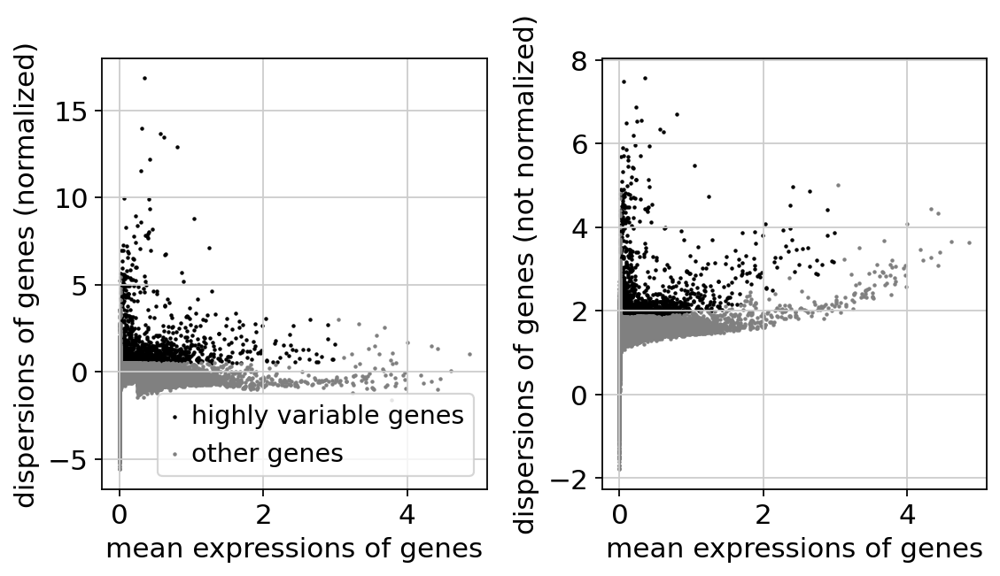

CPU times: user 888 ms, sys: 20 ms, total: 908 ms
Wall time: 902 ms


In [37]:
%%time
sc.pl.highly_variable_genes(adata)

In [38]:
adata_hvg = adata[:, adata.var['highly_variable']]

In [39]:
adata_hvg

View of AnnData object with n_obs × n_vars = 107050 × 2791
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ccgs', 'hvg'

In [40]:
%%time
sc.pp.scale(adata_hvg, max_value=10)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
CPU times: user 5.43 s, sys: 324 ms, total: 5.76 s
Wall time: 5.75 s


________

## PCA

In [52]:
%%time
sc.tl.pca(adata_hvg, svd_solver='arpack', n_comps=50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:29)
CPU times: user 2min 52s, sys: 2min 53s, total: 5min 45s
Wall time: 29.7 s


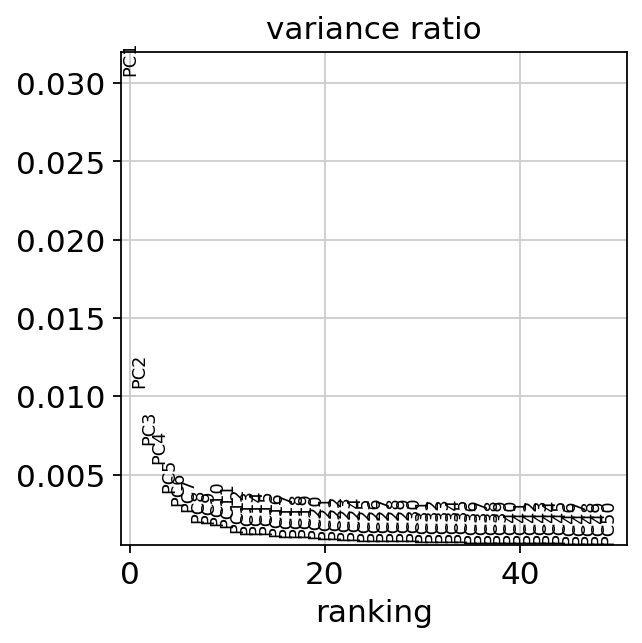

In [53]:
sc.pl.pca_variance_ratio(adata_hvg, n_pcs=50)

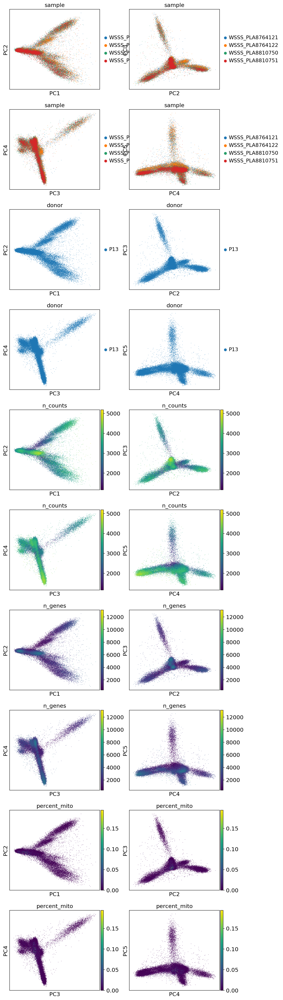

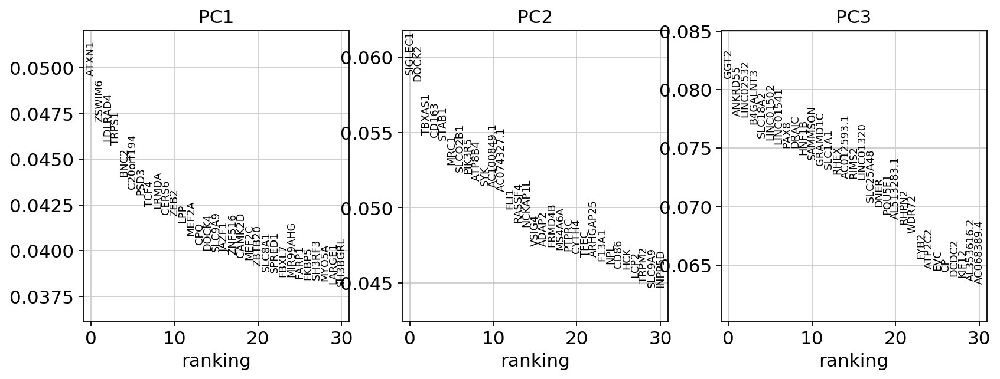

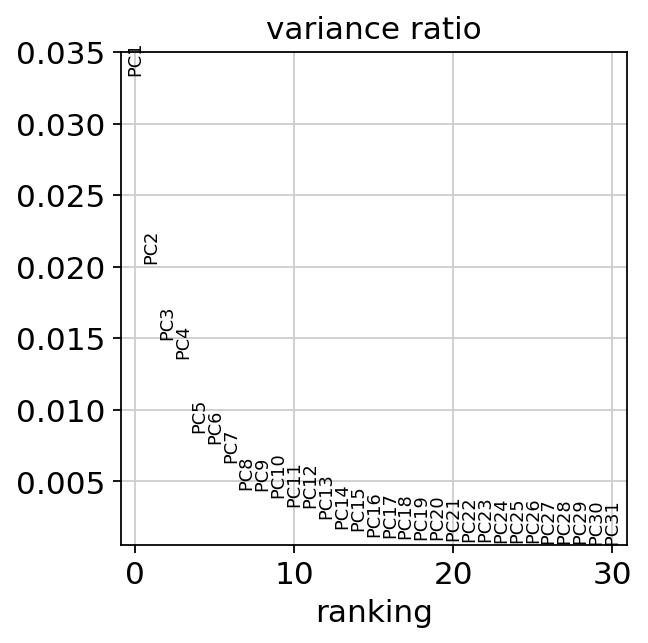

In [56]:
sc.pl.pca_overview(adata_hvg, color = ['sample', 'donor', 'n_counts', 'n_genes', 
                                    'percent_mito'], components = ['1,2', '2,3', '3,4', '4,5'], ncols = 2)

## OR

### Harmony

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:43)


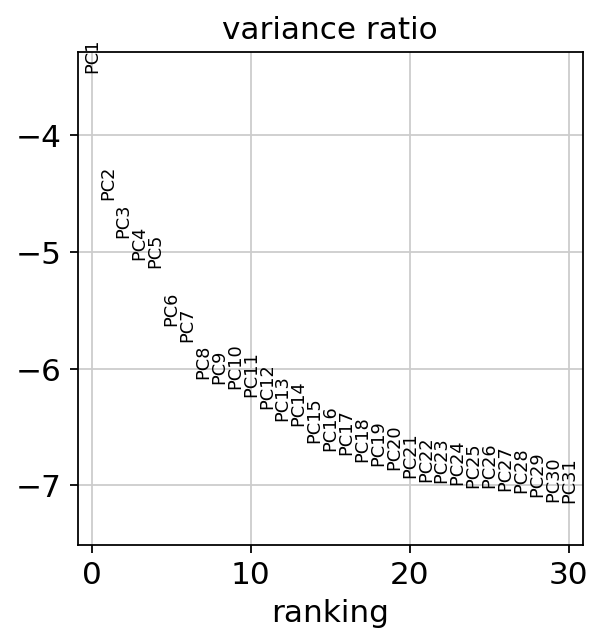

CPU times: user 3min 32s, sys: 3min 4s, total: 6min 37s
Wall time: 43.5 s


In [88]:
%%time
# trying out harmony here
# Check PCA again - needed for harmony - and extract PCA matrix and batch array
sc.tl.pca(adata_hvg)
n_pcs = 20
sc.pl.pca_variance_ratio(adata_hvg, log=True, save=False)
pca = adata_hvg.obsm['X_pca'][:, 0:n_pcs]
batch = adata_hvg.obs['sample']

In [89]:
# Batch-correct the PCA using HARMONY method
%load_ext rpy2.ipython

In [90]:
%%time
%%R -i pca -i batch -o hem

library(harmony)
library(magrittr)

hem <- HarmonyMatrix(pca, batch, theta=1, do_pca=FALSE)
hem = data.frame(hem)


R[write to console]: Loading required package: Rcpp

R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[

CPU times: user 31min 41s, sys: 23min 42s, total: 55min 24s
Wall time: 25min 8s


In [91]:
# Add harmony values to the anndata object
adata_hvg.obsm['X_pca'] = hem.values

In [81]:
# the next 3 cells run harmonypy but unfortunately they take forever...

_______

### Neighbourhood graph & UMAP

__________________________________________________________________________________________________________________________________________________________________

In [92]:
%%time
sc.pp.neighbors(adata_hvg, n_neighbors=10, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../opt/conda/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../opt/conda/lib/python3.7/site-packages/umap/nndes

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:39)
CPU times: user 38.1 s, sys: 1.22 s, total: 39.3 s
Wall time: 39.3 s


### OR

BBKNN by donor


In [54]:
%%time
bbknn.bbknn(adata_hvg, batch_key='sample')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:24)
CPU times: user 24.5 s, sys: 8 ms, total: 24.5 s
Wall time: 24.5 s


/opt/conda/lib/python3.7/site-packages/bbknn/__init__.py:289: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = bbknn_out[0]
/opt/conda/lib/python3.7/site-packages/bbknn/__init__.py:290: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = bbknn_out[1]


__________________________________________________________________________________________________________________________________________________________________

In [55]:
%%time
sc.tl.umap(adata_hvg, random_state=0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:42)
CPU times: user 3min 50s, sys: 1min 25s, total: 5min 16s
Wall time: 2min 42s


# Plotting

In [56]:
adata_hvg

AnnData object with n_obs × n_vars = 107050 × 2791
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'ccgs', 'hvg', 'pca', 'neighbors', 'umap', 'stimulation_colors',

In [57]:
markers = ['CD4','CD3G', 'FOXJ1', 'IL2R', 'TRDV2', 'CD8', # T cells
                             'CD19', 'MS4A1', # B cells
                              'CD27', 'CD38', 'JCHAIN', # Plasma B cells
                             'NCAM1', 'FCGR3A', # NK celss
                             'HBB', # Erythrocytes
                             'FCGR3B', # Neutrophils
                             'CD14', 'S100A12', # Monocytes
                             'FLT3', # Dendritic cells
                             'IRF4', 'CLEC9A', # cDC1
                             'CD1C', # cDC2
                             'TNFRSF21', # pDC and IRF4
                             'CD34', # Precursors
                             'PPBP', 'TUBB1', 'PF4', # Platelets
                             'MI67', # cycling
                            ]

### BBKNN by `sample`

on object with 50 PCs calculated

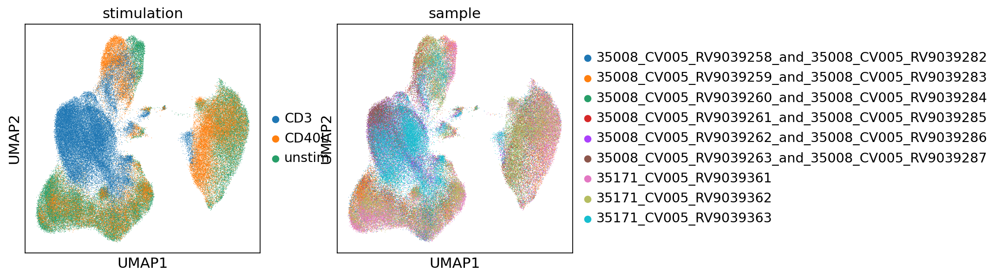

In [58]:
sc.pl.umap(adata_hvg, color=['stimulation','sample'])

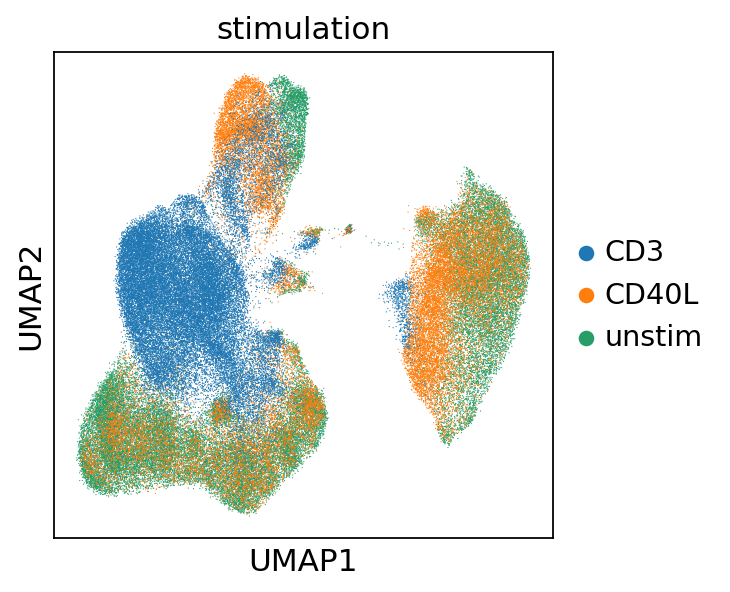

In [59]:
sc.pl.umap(adata_hvg, color=['stimulation'])

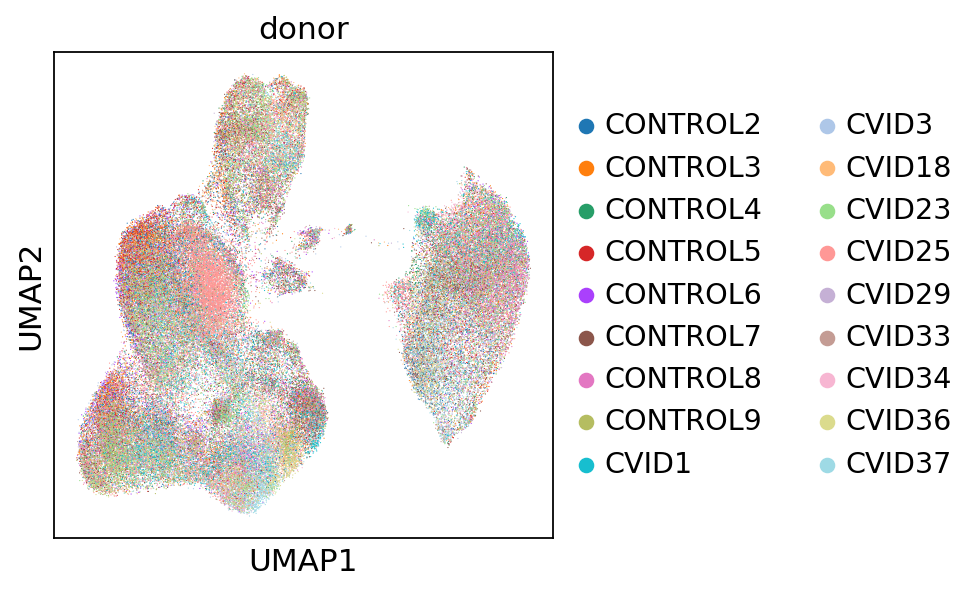

In [60]:
sc.pl.umap(adata_hvg, color=['donor'])

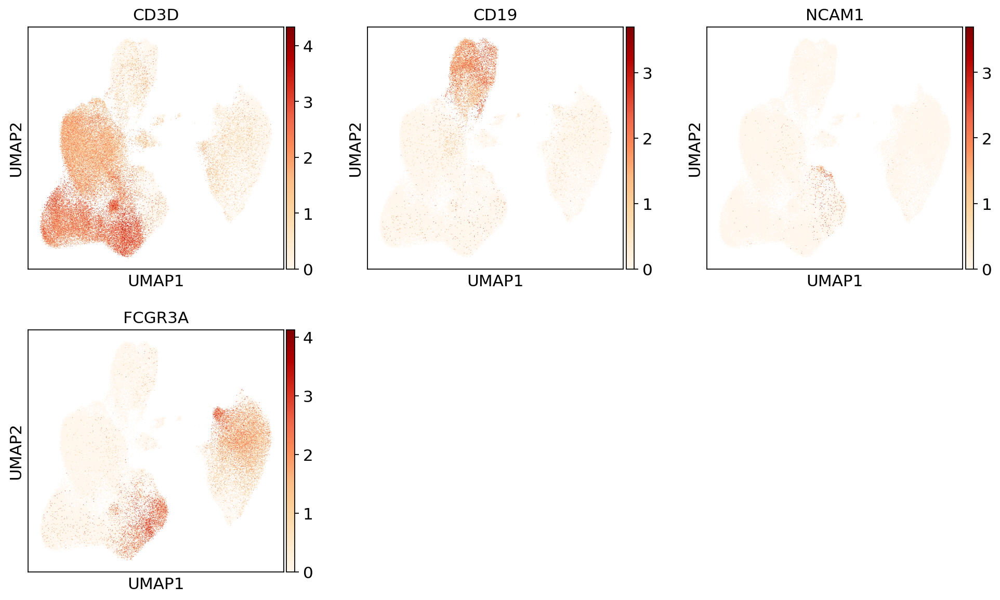

In [61]:
sc.pl.umap(adata_hvg, color=['CD3D', # T cells
                             'CD19', # B cells
                             # NK markers
                             'NCAM1', # CD56
                             'FCGR3A', # CD16
                            ], ncols=3, use_raw=True, cmap='OrRd')

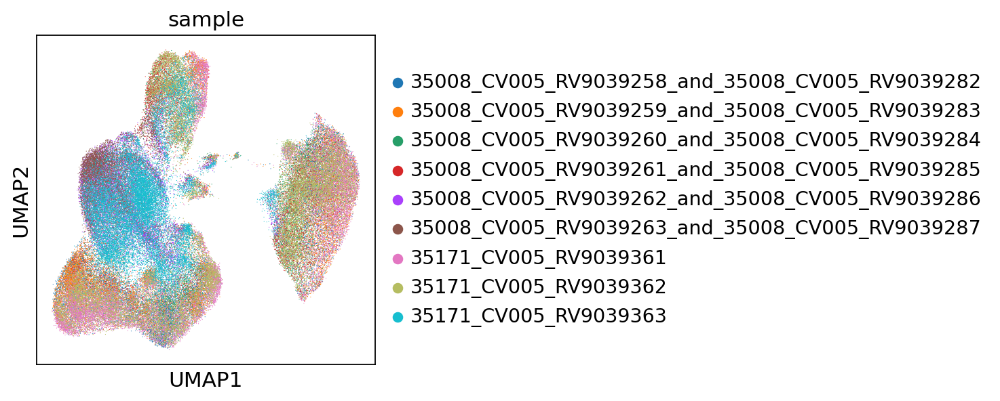

In [62]:
sc.pl.umap(adata_hvg, color=['sample'])

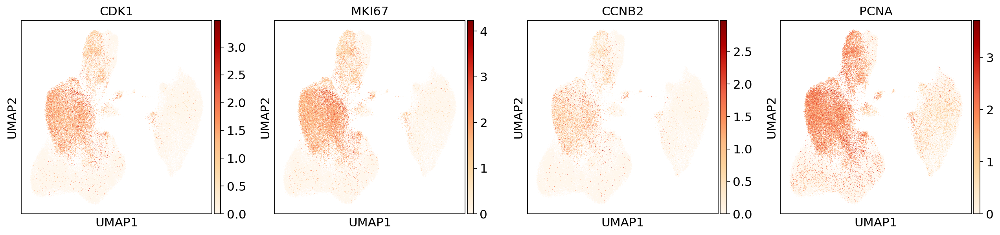

In [63]:
sc.pl.umap(adata_hvg, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [64]:
adata_hvg

AnnData object with n_obs × n_vars = 107050 × 2791
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'ccgs', 'hvg', 'pca', 'neighbors', 'umap', 'stimulation_colors',

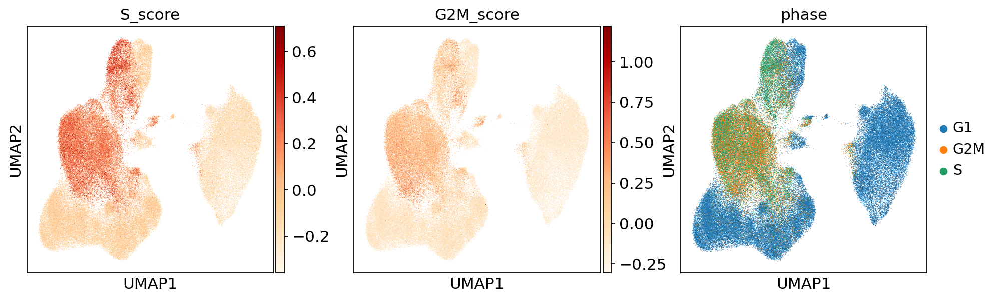

In [65]:
sc.pl.umap(adata_hvg, color=['S_score','G2M_score','phase'], cmap='OrRd')

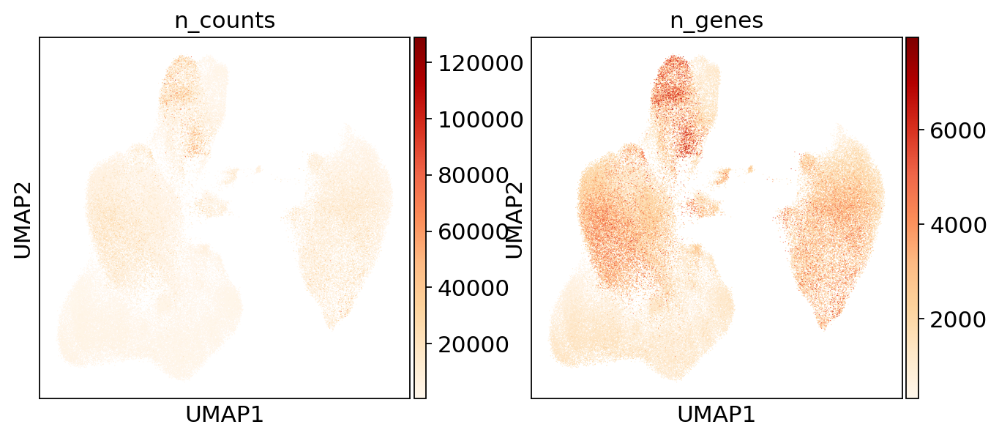

In [66]:
sc.pl.umap(adata_hvg, color=['n_counts',
                             'n_genes'], cmap='OrRd')

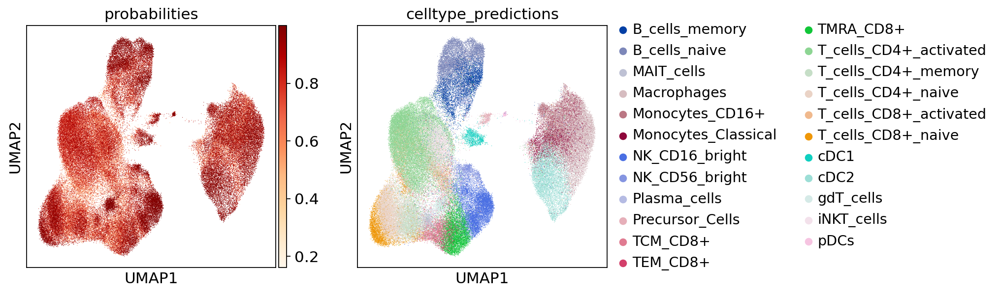

In [67]:
sc.pl.umap(adata_hvg, color=['probabilities','celltype_predictions'], cmap='OrRd')

In [68]:
adata_hvg.write(save_path+'adata_hvg_bbknn_by_sample_validation_cohort_20210210.h5ad')

In [87]:
adata_hvg = sc.read(save_path+'adata_hvg_bbknn_by_sample_validation_cohort_20210210.h5ad')

### Unbiased clustering

In [71]:
%%time
sc.tl.louvain(adata_hvg, resolution=1.5)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:01:23)
CPU times: user 1min 23s, sys: 304 ms, total: 1min 23s
Wall time: 1min 23s


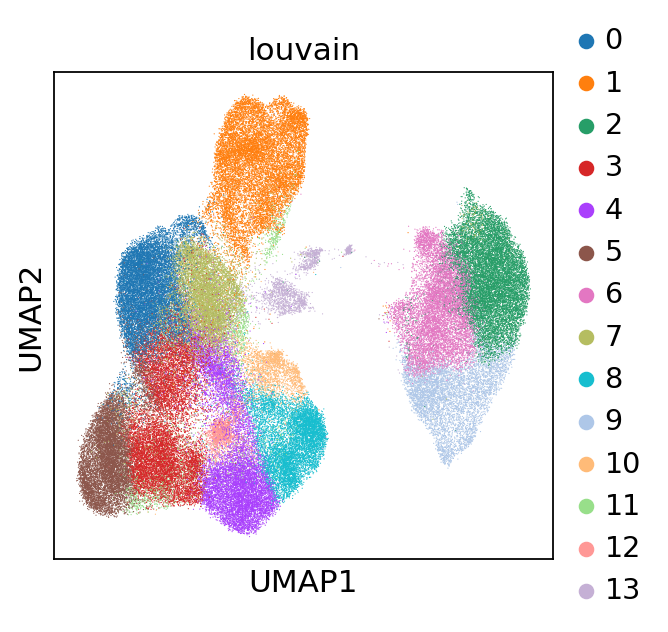

In [72]:
sc.pl.umap(adata_hvg, color=['louvain'])

## Preparing the object for cellxgene

In [73]:
adata_full = anndata.AnnData(X=adata_hvg.raw.X,
                            obs=adata_hvg.obs,
                            var=adata_hvg.raw.var,
                            obsm=adata_hvg.obsm)

In [74]:
adata_full

AnnData object with n_obs × n_vars = 107050 × 21557
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase', 'probabilities', 'celltype_predictions', 'louvain'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    obsm: 'X_pca', 'X_umap'

# Adding metadata

In [79]:
# get all the clinical metadata
metadata = pd.read_csv('./metadata/Supp_Table2_clinical_information LdPM.csv', header=1, index_col=0)

In [80]:
metadata

,CVID1,CVID3,CVID18,CVID23,CVID25,CVID29,CVID33,CVID34,CVID36,CVID37,...,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10
Age,66,34,33,50,34,22,36,66,31,42,...,19,42,34,52,37,33,37,31,28,31
Sex,female,male,male,male,male,male,male,male,male,male,...,female,male,male,male,female,female,male,male,female,male
Age of disease onset,30,4,19,21,4,8,31,64,25,40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Autoimmunity,Yes (vitiligo),No,Yes (celiac disease),No,No,No,Yes (diabetes),Yes (ITP),No,Yes (ITP),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gastrointestinal disease,No,No,Yes,No,No,No,No,Yes,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lung disease (bronchiectasis),Yes,Yes,No,No,Yes,No,No,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lymphoadenopathy,Yes,No,Yes,Yes,Yes,No,Yes,Yes,No,Yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Splenomegaly,Yes,No,Yes,Yes,Yes,No,Yes,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members",No,No,No,No,No,"Yes, mother IgA deficiency",No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:
metadata.columns

Index(['CVID1 ', 'CVID3', 'CVID18', 'CVID23', 'CVID25', 'CVID29', 'CVID33',
       'CVID34', 'CVID36', 'CVID37', 'CVID twin', 'Control twin', 'C1', 'C2',
       'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10'],
      dtype='object')

In [82]:
new_columns = ['CVID1', 'CVID3', 'CVID18', 'CVID23', 'CVID25', 'CVID29', 'CVID33',
       'CVID34', 'CVID36', 'CVID37', 'CVID_twin', 'CONTROL_twin', 'CONTROL1', 'CONTROL2',
       'CONTROL3', 'CONTROL4', 'CONTROL5', 'CONTROL6', 'CONTROL7', 'CONTROL8', 'CONTROL9', 'CONTROL10']
metadata.columns = new_columns

In [84]:
metadata

,CVID1,CVID3,CVID18,CVID23,CVID25,CVID29,CVID33,CVID34,CVID36,CVID37,...,CONTROL1,CONTROL2,CONTROL3,CONTROL4,CONTROL5,CONTROL6,CONTROL7,CONTROL8,CONTROL9,CONTROL10
Age,66,34,33,50,34,22,36,66,31,42,...,19,42,34,52,37,33,37,31,28,31
Sex,female,male,male,male,male,male,male,male,male,male,...,female,male,male,male,female,female,male,male,female,male
Age of disease onset,30,4,19,21,4,8,31,64,25,40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Autoimmunity,Yes (vitiligo),No,Yes (celiac disease),No,No,No,Yes (diabetes),Yes (ITP),No,Yes (ITP),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gastrointestinal disease,No,No,Yes,No,No,No,No,Yes,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lung disease (bronchiectasis),Yes,Yes,No,No,Yes,No,No,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lymphoadenopathy,Yes,No,Yes,Yes,Yes,No,Yes,Yes,No,Yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Splenomegaly,Yes,No,Yes,Yes,Yes,No,Yes,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members",No,No,No,No,No,"Yes, mother IgA deficiency",No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [85]:
metadata.index

Index([                                                                                         'Age',
                                                                                                'Sex',
                                                                               'Age of disease onset',
                                                                                       'Autoimmunity',
                                                                           'Gastrointestinal disease',
                                                                      'Lung disease (bronchiectasis)',
                                                                                  'Lymphoadenopathy ',
                                                                                       'Splenomegaly',
       'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members',
                                                                         

In [86]:
# dropping rows with only nans
rows2keep = [                                                                                         'Age',
                                                                                                'Sex',
                                                                               'Age of disease onset',
                                                                                       'Autoimmunity',
                                                                           'Gastrointestinal disease',
                                                                      'Lung disease (bronchiectasis)',
                                                                                  'Lymphoadenopathy ',
                                                                                       'Splenomegaly',
       'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members']


metadata = metadata.loc[rows2keep,:]

In [87]:
metadata

,CVID1,CVID3,CVID18,CVID23,CVID25,CVID29,CVID33,CVID34,CVID36,CVID37,...,CONTROL1,CONTROL2,CONTROL3,CONTROL4,CONTROL5,CONTROL6,CONTROL7,CONTROL8,CONTROL9,CONTROL10
Age,66,34,33,50,34,22,36,66,31,42,...,19,42,34,52,37,33,37,31,28,31
Sex,female,male,male,male,male,male,male,male,male,male,...,female,male,male,male,female,female,male,male,female,male
Age of disease onset,30,4,19,21,4,8,31,64,25,40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Autoimmunity,Yes (vitiligo),No,Yes (celiac disease),No,No,No,Yes (diabetes),Yes (ITP),No,Yes (ITP),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gastrointestinal disease,No,No,Yes,No,No,No,No,Yes,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lung disease (bronchiectasis),Yes,Yes,No,No,Yes,No,No,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lymphoadenopathy,Yes,No,Yes,Yes,Yes,No,Yes,Yes,No,Yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Splenomegaly,Yes,No,Yes,Yes,Yes,No,Yes,Yes,Yes,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members",No,No,No,No,No,"Yes, mother IgA deficiency",No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [88]:
def add_clinical_metadata(adata_obj, barcode, clinical_meta_row):
    
    curr_donor = adata_obj.obs.loc[barcode, 'donor']
    
    value = metadata.loc[clinical_meta_row, curr_donor]
    
    return(value)
    

In [90]:
adata_full.obs['barcode'] = adata_full.obs.index

In [91]:
for col2add in metadata.index:
    print(col2add)
    adata_full.obs[col2add] = adata_full.obs['barcode'].apply(lambda x: add_clinical_metadata(adata_full, x, col2add))

Age
Sex
Age of disease onset
Autoimmunity
Gastrointestinal disease
Lung disease (bronchiectasis)
Lymphoadenopathy 
Splenomegaly
History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members


In [92]:
np.unique(adata_full.obs['donor'])

array(['CONTROL2', 'CONTROL3', 'CONTROL4', 'CONTROL5', 'CONTROL6',
       'CONTROL7', 'CONTROL8', 'CONTROL9', 'CVID1', 'CVID18', 'CVID23',
       'CVID25', 'CVID29', 'CVID3', 'CVID33', 'CVID34', 'CVID36',
       'CVID37'], dtype=object)

In [93]:
len(np.unique(adata_full.obs['donor']))

18

In [94]:
# also adding general key of CVID status
adata_full.obs['CVID_status'] = ['CVID' if 'CVID' in donor else 'CONTROL' for donor in adata_full.obs['donor']]

... storing 'Age' as categorical
... storing 'Sex' as categorical
... storing 'Age of disease onset' as categorical
... storing 'Autoimmunity' as categorical
... storing 'Gastrointestinal disease' as categorical
... storing 'Lung disease (bronchiectasis)' as categorical
... storing 'Lymphoadenopathy ' as categorical
... storing 'Splenomegaly' as categorical
... storing 'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members' as categorical
... storing 'CVID_status' as categorical


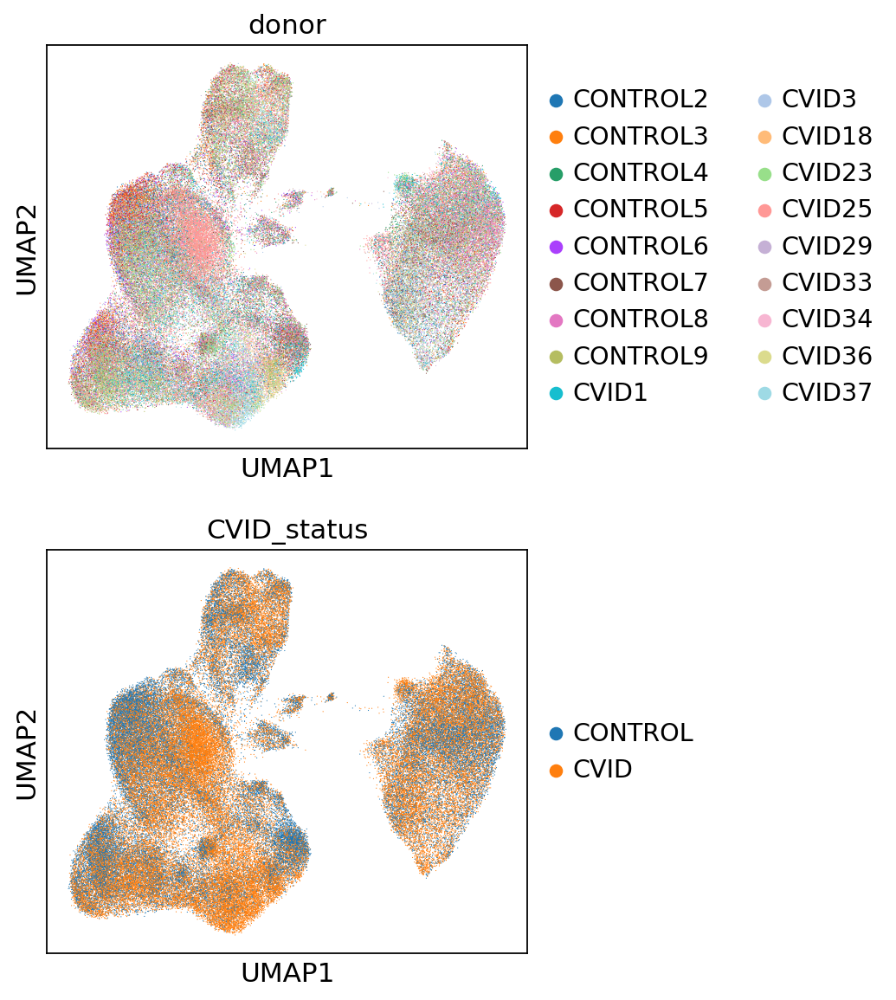

In [95]:
sc.pl.umap(adata_full, color=['donor','CVID_status'], ncols=1)

In [96]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

In [97]:
# saving this .obs table to use on the B cell object also
adata_full.obs.to_csv(save_path + '20210210_obs_table_final_object.csv')

In [98]:
import scipy
adata_full.X = scipy.sparse.csc_matrix(adata_full.X)


In [99]:
adata_full.obs.columns

Index(['batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes',
       'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score',
       'stimulation', 'technique', 'is_doublet', 'donor', 'S_score',
       'G2M_score', 'phase', 'probabilities', 'celltype_predictions',
       'louvain', 'barcode', 'Age', 'Sex', 'Age of disease onset',
       'Autoimmunity', 'Gastrointestinal disease',
       'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly',
       'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members',
       'CVID_status'],
      dtype='object')

In [100]:
categ_columns = ['batch', 'sample', 'scrublet_cluster_score', 'scrublet_score',
       'stimulation', 'donor', 'phase', 'celltype_predictions',
       'louvain', 'Age', 'Sex', 'Age of disease onset',
       'Autoimmunity', 'Gastrointestinal disease',
       'Lung disease (bronchiectasis)', 'Lymphoadenopathy ', 'Splenomegaly',
       'History of hypogammaglobulinemia, IgA deficiency or immunodeficiency in other family members',
       'CVID_status']

cont_columns = ['n_counts', 'n_genes',
       'percent_mito', 'S_score',
       'G2M_score', 'probabilities'
               ]


In [101]:
import pandas
for column in categ_columns:
    adata_full.obs[column] = pd.Categorical(adata_full.obs[column])
    
for column in cont_columns:
    adata_full.obs[column] = np.float32(adata_full.obs[column])

In [103]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

In [104]:
adata_full.write(save_path + 'adata_GEX_only_BBKNN_by_sample_validation_cohort_20210210.h5ad')

In [105]:
save_path + 'adata_GEX_only_BBKNN_by_sample_validation_cohort_20210210.h5ad'

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/adata_GEX_only_BBKNN_by_sample_validation_cohort_20210210.h5ad'